In [6]:
import photutils
import os
import sys
import numpy as np
import random

import astropy
from astropy.visualization import SqrtStretch, LogStretch
from photutils import detect_threshold
from astropy.io import fits
from astropy.wcs import WCS
from astropy.modeling.fitting import LevMarLSQFitter
from astropy.modeling.functional_models import Gaussian2D

from pyspark.sql.types import Row
from pyspark import SparkContext
from pyspark.sql import SparkSession

from astropy.visualization.mpl_normalize import ImageNormalize
from astropy.convolution import Gaussian2DKernel
from astropy.stats import gaussian_fwhm_to_sigma
from photutils import detect_sources
import time
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

import shutil
from math import pi, log, sqrt

import warnings
warnings.filterwarnings("ignore")

In [7]:
# Define data paths
DR2_path = "/data/astronomy-big-data/bc96e9620e41b9aba98292d37b5eec24/LoTSS_DR2/"
mosaic_path = "/data/astronomy-big-data/bc96e9620e41b9aba98292d37b5eec24/LoTSS_DR2_mosaic/"

In [8]:
# Take a look at the data in a .fits file
hdul = fits.open(mosaic_path + "P244+48_mosaic-blanked.fits")
data = hdul[0].data # The intensity data
print(hdul[0].__dict__)

{'_header_str': None, '_file': <astropy.io.fits.file._File <_io.FileIO name='/data/astronomy-big-data/bc96e9620e41b9aba98292d37b5eec24/LoTSS_DR2_mosaic/P244+48_mosaic-blanked.fits' mode='rb' closefd=True>>, '_buffer': None, '_header_offset': 0, '_data_offset': 2880, '_data_size': 641681280, '_data_replaced': False, '_data_needs_rescale': False, '_new': False, '_output_checksum': False, '_checksum': None, '_checksum_valid': None, '_datasum': None, '_datasum_valid': None, '_do_not_scale_image_data': False, '_uint': True, '_scale_back': None, '_bzero': 0, '_bscale': 1, '_axes': [8956, 8956], '_bitpix': -64, '_gcount': 1, '_pcount': 0, '_blank': None, '_orig_bitpix': -64, '_orig_blank': None, '_orig_bzero': 0, '_orig_bscale': 1, '_modified': False, '_header': SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions             

In [9]:
print(hdul[0]._header['OBJECT'])
print(hdul[0].header['OBJECT'])

P244+48
P244+48


In [10]:
# Import the .fits file header in the WCS class and create WCS based on the pixels
w = WCS(hdul[0].header)
ra, dec = w.all_pix2world(30, 40, 0, ra_dec_order=True)
print(ra, dec)
print(w.wcs_pix2world(30, 40, 0, ra_dec_order=True))

247.17376815618553 45.716608263119596
(array(247.17376816), array(45.71660826))


In [13]:
def getSources(file):
    # Take a look at the data in a .fits file
    hdul = fits.open(os.path.join(mosaic_path + file))
    data = hdul[0].data # The intensity data
    w = WCS(hdul[0].header)
    
    # Define noise threshold
    threshold = detect_threshold(data, nsigma=3.)
    
    # Sigma?
    sigma = 3.0 * gaussian_fwhm_to_sigma  # FWHM = 3.
    # Use kernel (3x3) to find borders of sources
    kernel = Gaussian2DKernel(sigma, x_size=5, y_size=5) # x=3, y=3
    kernel.normalize()
    # sources = object with label of sources for each pixel in the fits file
    sources = detect_sources(data, threshold, npixels=16, filter_kernel=kernel)
    
    
    # Create nice figure
    norm = ImageNormalize(stretch=LogStretch())
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12.5))
    ax1.imshow(data, origin='upper', cmap='Greys_r', norm=norm)
    ax1.set_title('Data')
    cmap = sources.make_cmap(random_state=12345)
    cmap.set_bad(color='white')
    ax2.imshow(sources, origin='upper', cmap=cmap)
    ax2.set_title('Segmentation Image')
    
    x = hdul[0]._header['NAXIS1']
    y = hdul[0]._header['NAXIS2']

    plt.figure(figsize=(x/1000, y/1000), dpi=100)
    plt.imshow(sources, origin='upper', cmap=cmap)
    plt.savefig('example_' + file.split('_')[0] + '.png', dpi=1000)
    
    return hdul[0]._header, data, sources
    

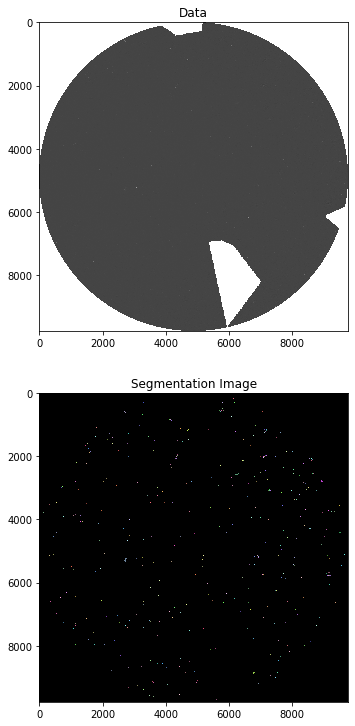

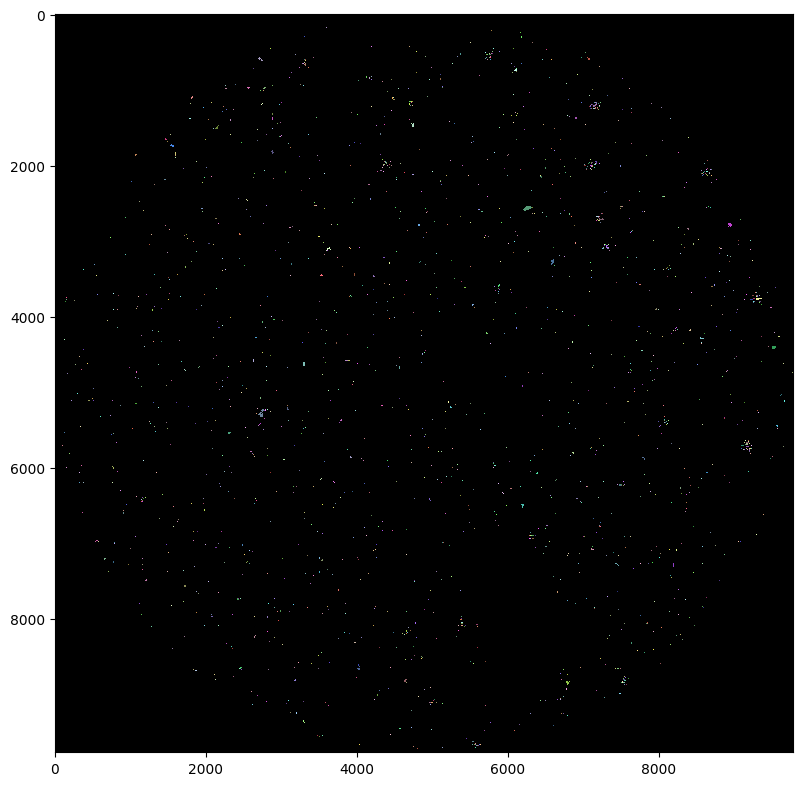

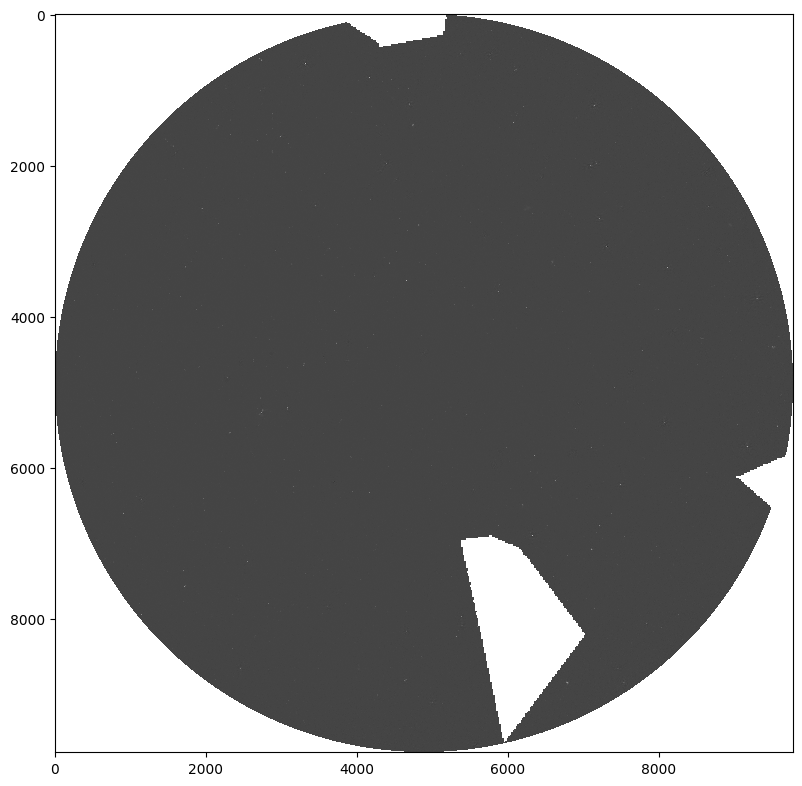

In [14]:
P000_header, P000_data, P000_sources = getSources("P000+38_mosaic-blanked.fits")

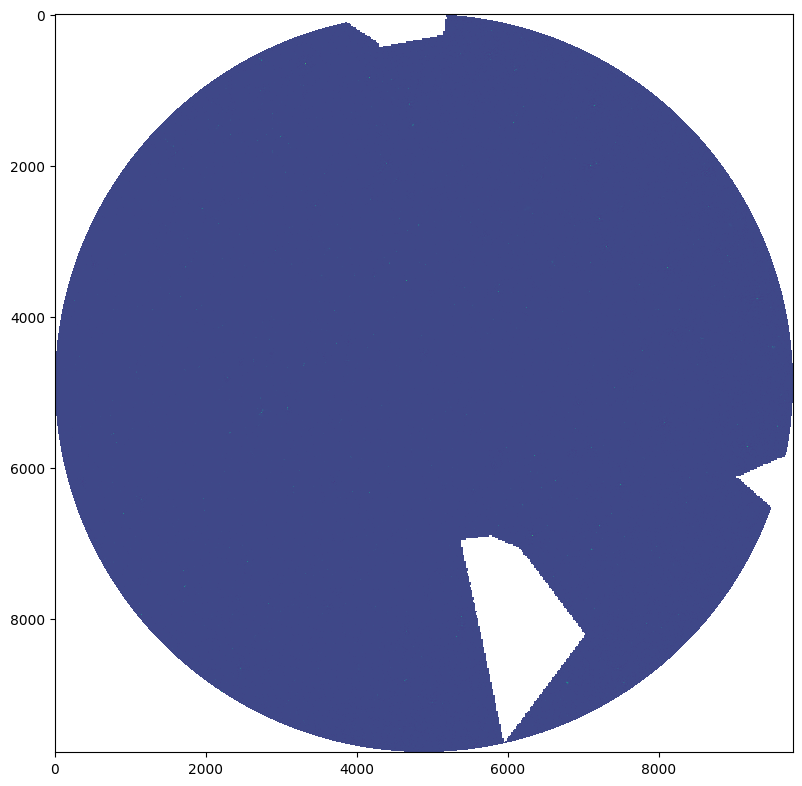

In [20]:
norm = ImageNormalize(stretch=LogStretch())
plt.figure(figsize=(P000_header["NAXIS1"]/1000, P000_header["NAXIS2"]/1000), dpi=100)
plt.imshow(P000_data, origin='upper', norm=norm)
plt.savefig('example_data_log_' + P000_header["OBJECT"].split('_')[0] + '.png', dpi=1000)

In [8]:
print(P000_header["CDELT1"])
print(P000_header["CDELT2"])

-0.00041666666666666
0.000416666666666666


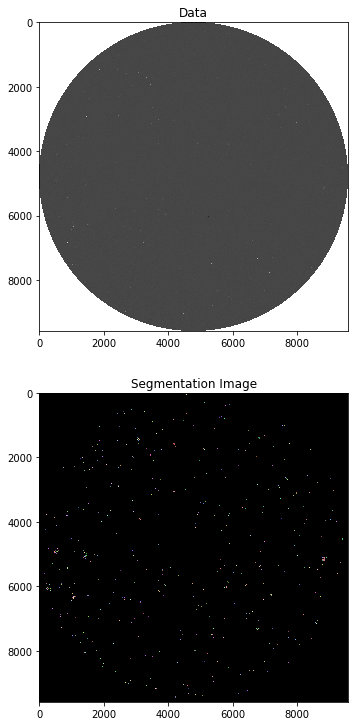

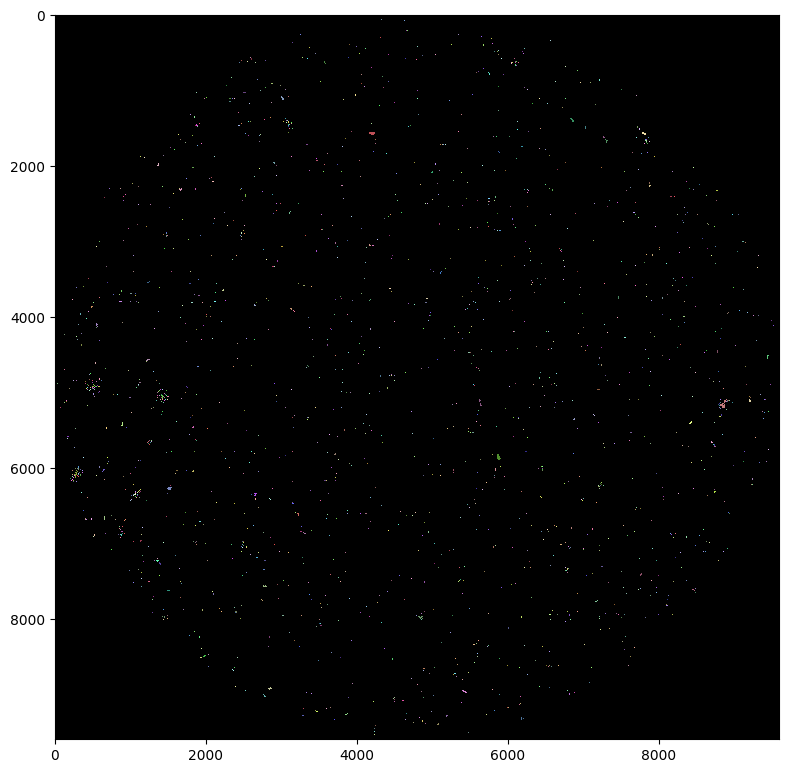

In [9]:
P004_header, P004_data, P004_sources = getSources("P004+38_mosaic-blanked.fits")

In [10]:
print(P004_header["CDELT1"])
print(P004_header["CDELT2"])

-0.00041666666666666
0.000416666666666666


In [11]:
# Content of the labelled sources
P000_sources.__dict__

{'_data': array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 'labels': array([   1,    2,    3, ..., 5816, 5817, 5818]),
 'max_label': 5818}

In [31]:
def create_sub_matrices(data, sources, s=10):
    min_max_coords = np.full((sources.max_label, 2, 2), ((np.inf, np.inf), (-np.inf, -np.inf)))
    for c in range(np.shape(data)[1]): # x / cols
        for r in range(np.shape(data)[0]): # y / rows
            lab = sources.data[r, c] - 1  # Label of pixel row, col
            if lab + 1 != 0:
                # Define min max coords
                min_coords = min_max_coords[lab][0]
                max_coords = min_max_coords[lab][1]
                # Check if smallest y / row coordinate
                if r < min_coords[0]:
                    min_coords[0] = r
                # Check if biggest y / row coordinate
                elif r > max_coords[0]:
                    max_coords[0] = r
                # Check if smallest x / col coordinate
                if c < min_coords[1]:
                    min_coords[1] = c
                # Check if biggest x / col coordinate
                elif c > max_coords[1]:
                    max_coords[1] = c
    
    min_max_coords = min_max_coords.astype(int)
    source_intensities = []
    for i in range(len(min_max_coords)):
        # Define min and max coords
        min_coords = min_max_coords[i][0]
        max_coords = min_max_coords[i][1] + 1
        # Get intensity matrix
        mat = data[min_coords[0]:max_coords[0], min_coords[1]:max_coords[1]] # r1 to r2, c1 to c2
        # Skip objects at the edge
        if np.sum(np.isnan(mat)) == 0:
            # Mask of labels using source matrix
            mask = sources.data[min_coords[0]:max_coords[0],
                                min_coords[1]:max_coords[1]]
            # Only take labels of current source and factor it against the intensities
            source_intensities.append((mask == i+1) * mat)
        else:
            source_intensities.append(mat * 0)
            
            # --------------------------------------------------
            # print(i)
            # mat = data[min_coords[0]-5:max_coords[0]+5,
            #            min_coords[1]-5:max_coords[1]+5]
            # mask = sources.data[min_coords[0]-5:max_coords[0]+5,
            #                     min_coords[1]-5:max_coords[1]+5]
            # Only take labels of current source and factor it against the intensities
            # source_intensities.append((mask == i+1) * mat)
            # --------------------------------------------------
            
    return min_max_coords, np.array(source_intensities)

In [32]:
start = time.time()
P000_min_max_coords, P000_source_intensities = create_sub_matrices(P000_data, P000_sources)
print(time.time()-start)

142.0389964580536


In [33]:
"""
np.savetxt("foo.csv", P000_source_intensities[idx][5:-5, 5:-5], delimiter=",", fmt='%1.4f')
idx = 5593
print(P000_min_max_coords[idx])
mask = P000_sources.data[P000_min_max_coords[idx][0][0]-6:P000_min_max_coords[idx][1][0]+5,
                         P000_min_max_coords[idx][0][1]-6:P000_min_max_coords[idx][1][1]+5]
# print(mask)
# print(P000_source_intensities[idx])
fig, ax = plt.subplots(nrows=1, ncols=1)
ax.imshow(P000_source_intensities[idx])
rect = plt.Rectangle((4,4),15,14, fill=False, color='r', alpha=1)
ax.add_patch(rect)
"""


'\nnp.savetxt("foo.csv", P000_source_intensities[idx][5:-5, 5:-5], delimiter=",", fmt=\'%1.4f\')\nidx = 5593\nprint(P000_min_max_coords[idx])\nmask = P000_sources.data[P000_min_max_coords[idx][0][0]-6:P000_min_max_coords[idx][1][0]+5,\n                         P000_min_max_coords[idx][0][1]-6:P000_min_max_coords[idx][1][1]+5]\n# print(mask)\n# print(P000_source_intensities[idx])\nfig, ax = plt.subplots(nrows=1, ncols=1)\nax.imshow(P000_source_intensities[idx])\nrect = plt.Rectangle((4,4),15,14, fill=False, color=\'r\', alpha=1)\nax.add_patch(rect)\n'

In [34]:
P004_min_max_coords, P004_source_intensities = create_sub_matrices(P004_data, P004_sources)

In [107]:
def create_catalogue_submatrix(header, data, sources, coords, mat, index, plot=True, plot2=False):
    diameter_beam = header['BMAJ'] * 3600
    conv = pi * pow(diameter_beam, 2) / (4 * log(2))
    deconv = lambda axis: sqrt( (pow( axis * 2 * sqrt(2 * log(2)), 2) - 16).clip(min=0) )
    W = WCS(header)
    
    # Define min and max coords
    min_coords = coords[0] # min r, min c
    max_coords = coords[1] # min r, min c
    
    # print(min_coords[0])
    # print(min_coords[1])
    
    # matrix filled with index values so first row for x = [0, 1, 2, ...] and y = [0, 0, 0, ..]
    # Used to fit gaussian and to calculate norm center of mass
    y, x = np.mgrid[:mat.shape[0], :mat.shape[1]]
    
    # print(x, y)
    
    # Get sum intensity
    sum_mat = np.sum(mat)
    integrated_intensity = conv * sum_mat
    
    # Brightest pixel (account for local submatrix coordinates)
    brightest_pixel_y, brightest_pixel_x = np.unravel_index(np.argmax(mat, axis=None), mat.shape)
    brightest_pixel = mat[(brightest_pixel_y, brightest_pixel_x)]
    brightest_pixel_y += min_coords[0] # Add the min row/ y coord of source
    brightest_pixel_x += min_coords[1] # Add the min col / x coord of source
    brightest_pixel_RA, brightest_pixel_DEC = W.all_pix2world(brightest_pixel_x,
                                                              brightest_pixel_y, 0, ra_dec_order=True)
    
    # print(W.all_pix2world(brightest_pixel_y, brightest_pixel_x, 0, ra_dec_order=False))
    
    center_of_mass_y, center_of_mass_x = np.sum(np.sum(np.array(( (y + min_coords[0]),
                                                                  (x + min_coords[1]) )) * mat, axis=1), axis=1) / sum_mat 
    
    # print(center_of_mass_x - min_coords[1])
    # print(center_of_mass_y - min_coords[0])
    
    center_of_mass_RA, center_of_mass_DEC = W.all_pix2world(center_of_mass_x,
                                                            center_of_mass_y, 0, ra_dec_order=True)
    
    
    # Define parameters of gaussian
    x_m = center_of_mass_x - min_coords[1]
    y_m = center_of_mass_y - min_coords[0]
    x_s = max_coords[1] - min_coords[1] + 1 # max_coords[0] - min_coords[0] + 1
    y_s = max_coords[0] - min_coords[0] + 1 # max_coords[1] - min_coords[1] + 1
    total_pixels = np.sum(mat > 0)
    
    # Define model
    mod = astropy.modeling.functional_models.Gaussian2D(
        amplitude=brightest_pixel, # Max intensity of source
        x_mean=x_m,    # X center of mass
        y_mean=y_m,    # Y center of mass
        x_stddev=x_s,  # X of submatrix
        y_stddev=y_s   # Y of submatrix
    )
    
    # Setting resutrictions for model
    mod.x_mean.min=0   # x_mean Min = 0
    mod.y_mean.min=0   # y_mean Min = 0
    mod.x_mean.max=x_s # x_mean Max = X of submatrix
    mod.y_mean.max=y_s # y_mean Max = Y of submatrix

    mod.x_stddev.min=0   # x_stdv Min = 0
    mod.y_stddev.min=0   # y_stdv Min = 0
    mod.x_stddev.max=x_s # x_stdv Max = X of submatrix
    mod.y_stddev.max=y_s # y_stdv Max = Y of submatrix
    
    fitter = astropy.modeling.fitting.LevMarLSQFitter() # Use least square fitter
    
    best_fit_gauss = fitter(mod, x, y, mat) # Fit model

    # Define centers of gaussian fit
    center_of_gaus_fit_x = best_fit_gauss.x_mean.value + min_coords[1]
    center_of_gaus_fit_y = best_fit_gauss.y_mean.value + min_coords[0]
    center_of_gaus_fit_RA, center_of_gaus_fit_DEC = W.all_pix2world(center_of_gaus_fit_x,
                                                                    center_of_gaus_fit_y, 0, ra_dec_order=True)
    
    # Define axis and theta of fit
    fit_x_axis = best_fit_gauss.x_stddev.value
    fit_y_axis = best_fit_gauss.y_stddev.value
    fit_theta  = best_fit_gauss.theta.value
            
    deconv_x = deconv(fit_x_axis)
    deconv_y = deconv(fit_y_axis)
    
    test_source = sources.data[min_coords[0]:max_coords[0],
                               min_coords[1]:max_coords[1]]
    test_data = data[min_coords[0]:max_coords[0],
                     min_coords[1]:max_coords[1]] * (test_source == index+1)
    
    """
    # print(test_source)
    # print('max:', np.amax(mat))
    print('cat_loc:', data[brightest_pixel_x, brightest_pixel_y])
    
    if np.amax(mat) != data[brightest_pixel_x, brightest_pixel_y]:
        print("FALSE")
    else:
        print("TRUE")
    
    print('----------------------------------------')
    """
    
    """
    print('x axis:', x_s)
    print('y axis:', y_s)
    print('total pixels:', total_pixels)
    print('center of mass x:', x_m)
    print('center of mass y:', y_m)
    print('fit x axis:', fit_x_axis)
    print('fit y axis:', fit_y_axis)
    print('angle:', fit_theta)
    print('deconv x:', deconv_x)
    print('deconv y:', deconv_y)
    """    
    
    # Integrated intensity of fit
    integrated_intensity_fit = conv * np.sum(best_fit_gauss(x, y))
    
    # Residual / Source (sum intensities)
    ratio_residual = np.sum((mat - best_fit_gauss(x, y)).clip(min=0)) / sum_mat
    
    num_pxl = max(x_s, y_s) + 5
    w, h = sources.data.shape

    left = brightest_pixel_x - num_pxl if brightest_pixel_x - num_pxl > 0 else 0
    top = brightest_pixel_y - num_pxl if brightest_pixel_y  - num_pxl > 0 else 0
    right = brightest_pixel_x + num_pxl if brightest_pixel_x + num_pxl < w else w
    bottom = brightest_pixel_y + num_pxl if brightest_pixel_y + num_pxl < h else h

    s_crop =  sources.data[top:bottom, left:right] #sources.data[left:right, top:bottom]
    cmap = sources.make_cmap(random_state=12345)
    
    d_crop = data[top:bottom, left:right] # data[left:right, top:bottom] # 
    
    if plot == True:
        """
        # Create figure and axes4
        fig,ax = plt.subplots(1)

        # Display the image
        ax.imshow(r_crop, origin='lower', cmap=cmap)
        rect = Rectangle((brightest_pixel_x -5 - left,brightest_pixel_y-5-top),10,10,linewidth=1,edgecolor='r',facecolor='none')
        ax.add_patch(rect)
        
        ax.set_title("%s;#pxl:%s"%(header['OBJECT'], total_pixels))

        plt.show()      
        """

        plt.imshow(d_crop, origin='upper', cmap='Greys_r', norm=ImageNormalize(stretch=LogStretch()))
        plt.scatter(brightest_pixel_x - left, brightest_pixel_y - top, s=4, c='red')
        plt.title("%s;#pxl:%s"%(header['OBJECT'], total_pixels))
        plt.show()
        
        plt.imshow(d_crop, origin='upper')
        plt.scatter(brightest_pixel_x - left, brightest_pixel_y - top, s=4, c='red')
        plt.title("%s;#pxl:%s"%(header['OBJECT'], total_pixels))
        plt.show()
        
        plt.imshow(mat, origin='upper', cmap='Greys_r')
        plt.scatter(brightest_pixel_x - min_coords[1], brightest_pixel_y - min_coords[0], s=4, c='red')
        plt.title("%s;#pxl:%s"%(header['OBJECT'], total_pixels))
        plt.show()
        
        
        # print(brightest_pixel_x - left, brightest_pixel_y - top)
        
        plt.imshow(s_crop, origin='upper', cmap=cmap)
        plt.scatter(brightest_pixel_x - left, brightest_pixel_y - top, s=4, c='red')
        plt.title("%s;#pxl:%s"%(header['OBJECT'], total_pixels))
        plt.show()
        

        plt.imshow(mat, origin='upper')
        plt.show()
        
        # Plot the data with the best-fit model
        plt.figure(figsize=(8, 2.5))
        plt.subplot(1, 4, 1)
        plt.imshow(mat, origin='upper', interpolation='nearest')
        plt.title("Data")
        plt.subplot(1, 4, 2)
        plt.imshow(mod(x, y), origin='upper', interpolation='nearest')
        plt.title("Model")
        plt.subplot(1, 4, 3)
        plt.imshow(best_fit_gauss(x, y), origin='upper', interpolation='nearest')
        plt.title("Fit")
        plt.subplot(1, 4, 4)
        plt.imshow((mat - best_fit_gauss(x, y)).clip(min=0), origin='upper', interpolation='nearest')
        plt.title("Residual")
        plt.show()
        
    if plot2:
        return d_crop, s_crop, cmap, brightest_pixel_x - left, brightest_pixel_y - top
    
    return np.array((total_pixels, x_s, y_s,
                     integrated_intensity, brightest_pixel, brightest_pixel_x, brightest_pixel_y,
                     brightest_pixel_RA, brightest_pixel_DEC, center_of_mass_x, center_of_mass_y,
                     center_of_mass_RA, center_of_mass_DEC, center_of_gaus_fit_x, center_of_gaus_fit_y,
                     center_of_gaus_fit_RA, center_of_gaus_fit_DEC, fit_x_axis, fit_y_axis, fit_theta,
                     integrated_intensity_fit, ratio_residual))

In [108]:
"""
header = ["total_pixels", "x_pixels", "y_pixels",
          "integrated_intensity", "brightest_pixel", "brightest_pixel_x", "brightest_pixel_y",
          "brightest_pixel_RA", "brightest_pixel_DEC", "center_of_mass_x", "center_of_mass_y",
          "center_of_mass_RA", "center_of_mass_DEC", "center_of_gaus_fit_x", "center_of_gaus_fit_y",
          "center_of_gaus_fit_RA", "center_of_gaus_fit_DEC", "fit_x_axis", "fit_y_axis", "fit_theta",
          "deconv_x", "deconv_y", "integrated_intensity_fit", "ratio_residual"
         ]
"""

header = ["total_pixels", "x_pixels", "y_pixels",
          "integrated_intensity", "brightest_pixel", "brightest_pixel_x", "brightest_pixel_y",
          "brightest_pixel_RA", "brightest_pixel_DEC", "center_of_mass_x", "center_of_mass_y",
          "center_of_mass_RA", "center_of_mass_DEC", "center_of_gaus_fit_x", "center_of_gaus_fit_y",
          "center_of_gaus_fit_RA", "center_of_gaus_fit_DEC", "fit_x_axis", "fit_y_axis", "fit_theta",
          "integrated_intensity_fit", "ratio_residual"
         ]

In [109]:
P000_index = 300 # random.randint(0, len(P000_source_intensities)) 
P004_index = 300 # random.randint(0, len(P004_source_intensities)) 

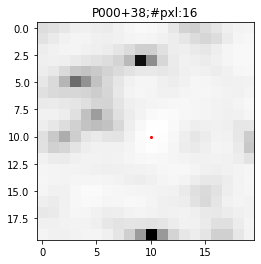

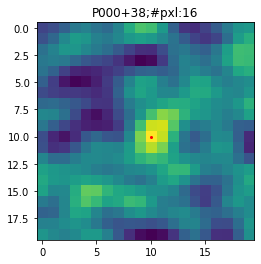

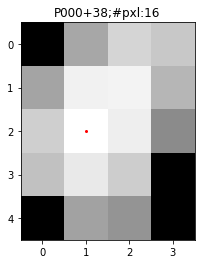

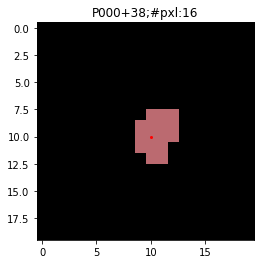

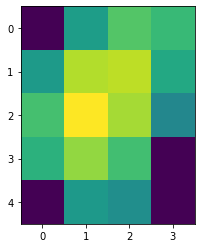

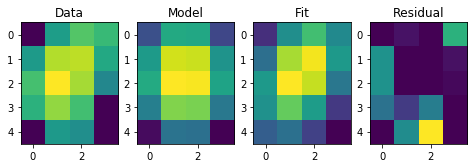

In [110]:
P000_sub_mat = create_catalogue_submatrix(P000_header, P000_data, P000_sources,
                                          P000_min_max_coords[P000_index], P000_source_intensities[P000_index],
                                          P000_index)

In [111]:
for i in range(len(P000_sub_mat)):
    print(header[i] + ":", P000_sub_mat[i])
print()

total_pixels: 16.0
x_pixels: 4.0
y_pixels: 5.0
integrated_intensity: 0.34286823350816337
brightest_pixel: 0.000754400294405544
brightest_pixel_x: 6104.0
brightest_pixel_y: 817.0
brightest_pixel_RA: 0.3132257954356078
brightest_pixel_DEC: 36.76620380137628
center_of_mass_x: 6104.473510490201
center_of_mass_y: 816.7649319492016
center_of_mass_RA: 0.31298031597022047
center_of_mass_DEC: 36.76610445667373
center_of_gaus_fit_x: 6104.492458650225
center_of_gaus_fit_y: 816.5821621262342
center_of_gaus_fit_RA: 0.31297109056975636
center_of_gaus_fit_DEC: 36.76602821650896
fit_x_axis: 1.1665080037054822
fit_y_axis: 1.9312731159458396
fit_theta: 0.4878767766244323
integrated_intensity_fit: 0.3482300605790783
ratio_residual: 0.08511206161103743



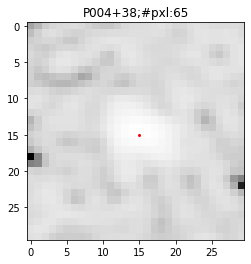

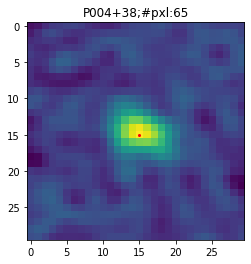

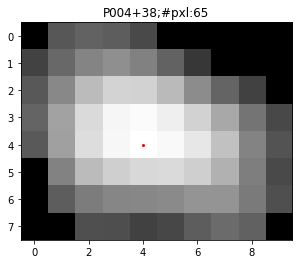

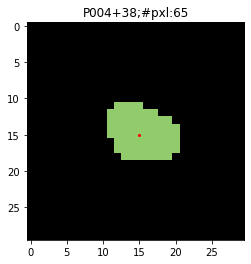

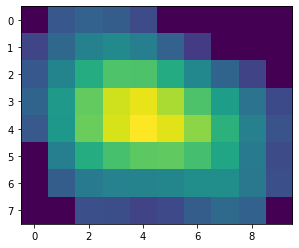

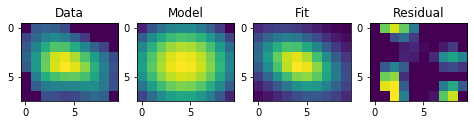

In [112]:
P004_sub_mat = create_catalogue_submatrix(P004_header, P004_data, P004_sources,
                                          P004_min_max_coords[P004_index], P004_source_intensities[P004_index],
                                          P004_index)


In [113]:
for i in range(len(P004_sub_mat)):
    print(header[i] + ":", P004_sub_mat[i])
print()

total_pixels: 65.0
x_pixels: 10.0
y_pixels: 8.0
integrated_intensity: 1.8012153351694153
brightest_pixel: 0.0013993861018346521
brightest_pixel_x: 3132.0
brightest_pixel_y: 1097.0
brightest_pixel_RA: 5.120696283857957
brightest_pixel_DEC: 36.9481370959835
center_of_mass_x: 3132.245502660866
center_of_mass_y: 1096.731209895364
center_of_mass_RA: 5.1205670086912685
center_of_mass_DEC: 36.94802602745248
center_of_gaus_fit_x: 3132.155183695801
center_of_gaus_fit_y: 1096.7120158568891
center_of_gaus_fit_RA: 5.12061400837311
center_of_gaus_fit_DEC: 36.94801767302667
fit_x_axis: 3.038786526669591
fit_y_axis: 1.8978219317545466
fit_theta: 0.368651551774988
integrated_intensity_fit: 1.8233517377485167
ratio_residual: 0.060313147292550384



In [114]:
def getStats(header, data, sources, min_max_coords, source_intensities):
    stats_mat = np.empty((sources.max_label, 22))
    for i in range(sources.max_label):
        stats_mat[i] = create_catalogue_submatrix(header, data, sources,
                                                  min_max_coords[i], source_intensities[i],
                                                  i, False)
    return stats_mat

In [115]:
P000_stats_mat = getStats(P000_header, P000_data, P000_sources, P000_min_max_coords, P000_source_intensities)

In [116]:
P004_stats_mat = getStats(P004_header, P004_data, P004_sources, P004_min_max_coords, P004_source_intensities)

In [117]:
print(P000_stats_mat[0])
print(P004_stats_mat[0])

[ 3.80000000e+01  7.00000000e+00  7.00000000e+00  1.32522743e+00
  1.78014880e-03  5.65700000e+03  6.80000000e+01  5.47349852e-01
  3.64550072e+01  5.65680985e+03  6.77431108e+01  5.47448910e-01
  3.64549005e+01  5.65670287e+03  6.76938819e+01  5.47504436e-01
  3.64548802e+01  1.47962208e+00  2.06805899e+00 -2.43061925e-01
  1.34297334e+00  6.04721566e-02]
[3.20000000e+01 7.00000000e+00 7.00000000e+00 8.00033170e-01
 1.14122269e-03 5.29300000e+03 3.00000000e+01 3.99547917e+00
 3.65063104e+01 5.29334821e+03 3.05836829e+01 3.99529785e+00
 3.65065533e+01 5.29340202e+03 3.04546183e+01 3.99527014e+00
 3.65064995e+01 1.52637798e+00 1.81508841e+00 7.03709455e-01
 8.22265010e-01 8.10109979e-02]


2.642101514004357 is near 2.6417919246301365
37.00100685666938 is near 37.00097230296399
2.483344924567482 is near 2.483499668816385
37.07409589817357 is near 37.07410308680026
2.699256787337242 is near 2.699149087015626
37.08019125910939 is near 37.080129910302134
2.737909164983379 is near 2.7378980075397017
37.10169181702537 is near 37.10190490670013
2.458476224980545 is near 2.458082626273212
37.110689304754494 is near 37.110394478417476
2.7209697091685174 is near 2.7209089727300455
37.11487588889841 is near 37.11501942219894
2.6798696537400732 is near 2.6800129843249794
37.14634681298799 is near 37.14614894845785
2.7064059139687178 is near 2.7062713596733667
37.14052673398513 is near 37.140668225402564
2.7273454084425035 is near 2.727686855422193
37.14145652878357 is near 37.14178704975908
2.8458234857726086 is near 2.8456492173685692
37.15290971786217 is near 37.1528735377237
2.656216937242418 is near 2.656100366590384
37.16420659803201 is near 37.164161448781336
2.739902437260696

2.145411405257025 is near 2.14552819767279
37.537397757358555 is near 37.53739140369291
2.1548971826587464 is near 2.154952828672386
37.53896654320349 is near 37.538812725288224
2.3472446372032594 is near 2.3474248796879014
37.53764094350549 is near 37.5375489889036
3.023172710688301 is near 3.0229759941774446
37.532944964722695 is near 37.53292664553639
2.3942081577339573 is near 2.3945044939327222
37.54706788391748 is near 37.547065763108506
2.3254278533177493 is near 2.325511535750556
37.551655132424905 is near 37.551358599134474
2.9326138572581817 is near 2.932842290162994
37.54786640312645 is near 37.54777266983915
2.7771755233895914 is near 2.77706869100831
37.556254142030724 is near 37.55631454700332
3.205718033370418 is near 3.205578294580624
37.553298629654364 is near 37.55305693308334
3.0617068955979954 is near 3.0614866028287793
37.55684264112094 is near 37.55666719342932
2.215918259059415 is near 2.215542358418946
37.572906963295786 is near 37.57282162796714
2.3773922545943

2.611438709397983 is near 2.6116200123819446
37.81006011298237 is near 37.80999089224771
3.320240090853184 is near 3.320274023471414
37.79570228585713 is near 37.79573980340617
3.249105837341167 is near 3.249036403720085
37.79921288680815 is near 37.79889740175666
2.656770159734347 is near 2.6570344714524845
37.80815391692291 is near 37.80812174203575
2.634693991718782 is near 2.634791068211955
37.81180964717706 is near 37.811982290826236
2.304102190526551 is near 2.3036495878436978
37.823210204191746 is near 37.823163805047606
2.9092921045383946 is near 2.909523396906181
37.8195984863633 is near 37.819644108183525
2.33586334753912 is near 2.3357008126589607
37.8286706479024 is near 37.82869728969066
3.325550338270314 is near 3.3253322666324565
37.81310096156859 is near 37.81286566598381
2.4213618257303295 is near 2.4211926440143348
37.829288190174346 is near 37.82923974027191
3.2443501943414805 is near 3.244584180140757
37.815979568393686 is near 37.81594446698151
3.1884437279059044 i

3.0268718815698437 is near 3.026987646760139
38.020954426660325 is near 38.02096794643032
2.6983740979669113 is near 2.698308633963294
38.02675230622646 is near 38.0270554580968
2.835947718624886 is near 2.836434287754689
38.02586139459828 is near 38.02589570828696
2.9549860668140404 is near 2.9549784630611198
38.0242947972303 is near 38.02435671593898
3.2958224018999798 is near 3.2956950453550853
38.02294703126586 is near 38.023064249490524
2.332989948121442 is near 2.332813118821813
38.04040430017813 is near 38.04037207022973
2.0875120346415326 is near 2.087587517986927
38.04430528040947 is near 38.04441930568524
3.2901363687638647 is near 3.2903453399520526
38.027229228449926 is near 38.02760398117213
2.6515831406342953 is near 2.6514651125826463
38.0399461322997 is near 38.03975815078616
2.9584804609340773 is near 2.958474864399604
38.03590449822313 is near 38.03606372605916
2.786523982830897 is near 2.786442879171674
38.03873531535328 is near 38.038613947162766
3.1215263973368548 

3.4598989257766384 is near 3.45996869439159
38.19126956238286 is near 38.19138950272987
3.473815826618763 is near 3.4737170287153702
38.19472180090193 is near 38.19481541650693
2.032413932571186 is near 2.032537384217598
38.21817769211149 is near 38.218023234391936
3.199781922352085 is near 3.1994463290636297
38.20447669072609 is near 38.204334384453425
2.6630994771497285 is near 2.6629984754765452
38.21481095579398 is near 38.21494527893589
2.0696227372934373 is near 2.0695298912184206
38.223244512249586 is near 38.22330349853195
2.5443235925177823 is near 2.5440900551076666
38.21773934988265 is near 38.21785419880882
2.164598883554886 is near 2.1644955940508073
38.22438043059737 is near 38.224618806886056
2.7916488968184288 is near 2.7917934697842757
38.22077733546994 is near 38.22079085997754
2.955029022577485 is near 2.9552313325997215
38.21851005783501 is near 38.21854952056652
2.846282178872544 is near 2.846456814316086
38.219905157137674 is near 38.21979345784639
3.0908761897828

3.015660159139596 is near 3.0154174863507652
38.390833666677345 is near 38.39088440884808
3.4564718837005066 is near 3.4562648048346625
38.383915142689474 is near 38.383872843054924
1.9476082493146532 is near 1.9471872829980312
38.4151942128748 is near 38.41518696478801
3.082129928053183 is near 3.082139764344303
38.40798322156171 is near 38.40782051819191
1.7429604272015706 is near 1.7429726694112966
38.425507751104455 is near 38.425588030090125
3.2502211961873804 is near 3.2502208552225813
38.40606050824079 is near 38.40604361397418
2.332907579899611 is near 2.3327083147825993
38.4258691657038 is near 38.42587516621862
3.0759077553545167 is near 3.0756635915278876
38.41351417640694 is near 38.413589545248364
2.978128273414177 is near 2.978249555515146
38.41816140296443 is near 38.417989179542154
2.9547834339997023 is near 2.954796469826788
38.42064618334839 is near 38.420649107452455
3.4232727655932376 is near 3.423020531303935
38.40879478027914 is near 38.4086433215499
3.04040633199

1.8705731874864107 is near 1.8706898452338243
38.58791655215023 is near 38.58788503138937
1.906289151439673 is near 1.9064390254033512
38.587631306751 is near 38.587769530067064
2.661657170919949 is near 2.661340538011565
38.579896046055545 is near 38.579978394243966
2.6084192186827933 is near 2.608473595988295
38.5835757645801 is near 38.58341875632509
2.314674546723564 is near 2.3145505536635707
38.586517081467655 is near 38.58644594602134
2.533769796076515 is near 2.5338134069525897
38.583771002110595 is near 38.58360193767062
1.91013801501883 is near 1.9098989794204395
38.5963504231411 is near 38.59617451016793
1.7986623597797897 is near 1.798485233651721
38.593041566959485 is near 38.59307056863385
1.8066640002677574 is near 1.8070165464308925
38.593400175813954 is near 38.59324814486183
2.820668894826799 is near 2.8206890579937554
38.583726424856756 is near 38.58369284408522
2.0962358144112248 is near 2.0960824809086356
38.5967666095666 is near 38.596815560163
2.1202615377365652 

2.609358287073662 is near 2.6091653672026283
38.71608491522741 is near 38.71595018316639
2.8449663107643306 is near 2.8452884001927368
38.71586659266375 is near 38.71567238189306
2.3253940524918626 is near 2.3251325007951564
38.72807564524762 is near 38.72831827155411
2.1549750597287662 is near 2.1551815826378373
38.72827489960925 is near 38.72833489805327
3.4902868103387945 is near 3.4900329710269684
38.708729901627656 is near 38.70869252402204
3.1422797512492053 is near 3.142696783680216
38.72279950947157 is near 38.722599321678146
2.518832920106526 is near 2.5185551545923017
38.72940995091389 is near 38.72923803179337
2.051437058217637 is near 2.051814779585922
38.734705640834434 is near 38.73520345024018
1.8126998600475375 is near 1.8126835216171622
38.74003014141216 is near 38.740084939020285
3.2112245316712986 is near 3.2110658089983923
38.722747926389665 is near 38.72280684368502
3.1584332199337366 is near 3.158661830517143
38.72666599370219 is near 38.72649892854682
3.145091508

1.7546524804466244 is near 1.7547406809182644
38.89795045069606 is near 38.89810038555018
2.7420303247089626 is near 2.7421762449364078
38.89292982395552 is near 38.89275623076375
2.9551401364022665 is near 2.954807691462876
38.89033943110177 is near 38.89069945689894
2.366316241091541 is near 2.366404595063681
38.90511558663613 is near 38.90527600447534
3.2332731618164883 is near 3.2331941747573802
38.893629367444206 is near 38.89343027163354
2.8713314361070785 is near 2.8716171783463786
38.900900691653945 is near 38.90059104411804
2.848384446828984 is near 2.8485193582627577
38.90418888636837 is near 38.90406934829837
2.1704555038421876 is near 2.1705831532854063
38.914385814629995 is near 38.914492304023526
2.327940768209291 is near 2.32810169095397
38.91473742528133 is near 38.915077774078206
3.146551188374505 is near 3.146675998056737
38.913195127844304 is near 38.91348715977789
2.6621933404203943 is near 2.661918998749292
38.91370101129802 is near 38.913373458732224
3.48599742386

2.9528678692744053 is near 2.95303318365496
39.07501322366236 is near 39.07487204571902
1.8797897099679872 is near 1.8801472643228645
39.08954894412417 is near 39.089504829646835
2.4246961810331547 is near 2.424978056779019
39.08484926214888 is near 39.08498892228756
2.9390289510255814 is near 2.9389923060910865
39.079414248670396 is near 39.07930118504377
2.9299263827178734 is near 2.9303803348000574
39.08040027919926 is near 39.0804555530224
2.9674327837193415 is near 2.9669430290836614
39.07726686989932 is near 39.077524244526366
2.517614260149009 is near 2.5178644861675403
39.08573973411045 is near 39.08596852586024
1.878245183520281 is near 1.8783679942760383
39.09456163109095 is near 39.094471159751116
2.1434848260406616 is near 2.1438209599988527
39.093434710626326 is near 39.093239434772904
2.292769828288856 is near 2.2926231062835942
39.093503010079026 is near 39.09329309262521
3.2102272732256254 is near 3.210131489550673
39.0778861245201 is near 39.07783119951631
2.5150504547

3.0107221361670637 is near 3.01087630359225
39.2349071841266 is near 39.234684772261275
2.7315307074136728 is near 2.7314580058998317
39.24109126658723 is near 39.241435142296
2.0612418784504625 is near 2.060797344353622
39.25759334269714 is near 39.257625993111034
2.130193451601289 is near 2.1301620744158383
39.26109503918676 is near 39.260969708490585
1.9504809219387922 is near 1.950690656571326
39.265246763392554 is near 39.26513057928271
3.041622422126495 is near 3.041107975161389
39.2602094937001 is near 39.260001591368386
2.880169180397691 is near 2.8801014939188763
39.26335934937199 is near 39.26325064048608
2.2563883092961015 is near 2.256335509074913
39.27394269380032 is near 39.27399398362379
2.39044255228225 is near 2.390442098589996
39.273642416828935 is near 39.27367089224272
2.5616028247209472 is near 2.5612049110377333
39.27102632031662 is near 39.27122353441158
2.589641298732608 is near 2.5897133975971744
39.272726435023756 is near 39.27245959251644
2.01367106303439 is 

2.411901448510322 is near 2.412053309821236
39.47551524621652 is near 39.47532274569499
2.105937476667861 is near 2.1059998202179124
39.486380499087865 is near 39.48645844741921
2.960574814411447 is near 2.960697514885103
39.475020923646014 is near 39.47503423763756
2.8025161474613025 is near 2.802348240535914
39.48216834105325 is near 39.481963762036386
2.6676003460756585 is near 2.6677757221892406
39.486690559641445 is near 39.48650134018225
2.3932845367666666 is near 2.3933192232386555
39.489079448142235 is near 39.48920359009371
3.2016874916734306 is near 3.201942821042291
39.48112996907692 is near 39.48115788750834
2.78162465907598 is near 2.7816827204964687
39.48874359647972 is near 39.48879570294491
2.547878293158987 is near 2.5482178880008775
39.49460841447581 is near 39.49443747752512
2.0652934832628587 is near 2.0652554699685894
39.51094064726355 is near 39.51072862892364
2.246833680547109 is near 2.246784538354314
39.51285333603329 is near 39.51267073332448
3.1462203193706 i

2.5243542651587485 is near 2.524632928013232
39.790028782628895 is near 39.79004462056462
2.8265006549452334 is near 2.82680569085922
39.78900656851504 is near 39.78902494237959
2.9052297651822316 is near 2.9054205189466704
39.79108113524003 is near 39.79076967697483
2.7713177822168293 is near 2.7713582784273085
39.79486154220918 is near 39.794603743328416
2.8114628877185006 is near 2.810957097909079
39.794660699443085 is near 39.794670587785994
2.6181353493796635 is near 2.6180160504217307
39.80960048618932 is near 39.80969780171837
2.6045839608489003 is near 2.6049871184835665
39.81020545416499 is near 39.80993600218771
2.7913006309371178 is near 2.7916122129070122
39.811647280396194 is near 39.81152596347888
2.3454115793239523 is near 2.345856039362659
39.819760770975 is near 39.81984519493214
2.7213585961632942 is near 2.721628990011515
39.835213395038494 is near 39.835244663764634
2.668532494305429 is near 2.6686261748856457
39.850156592387506 is near 39.850395317666795
2.46881513

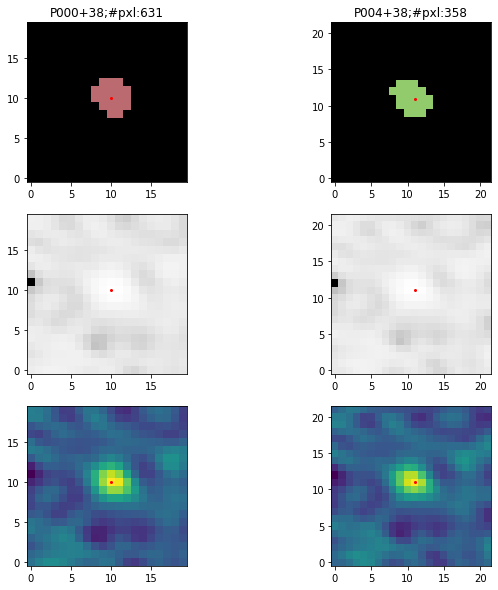

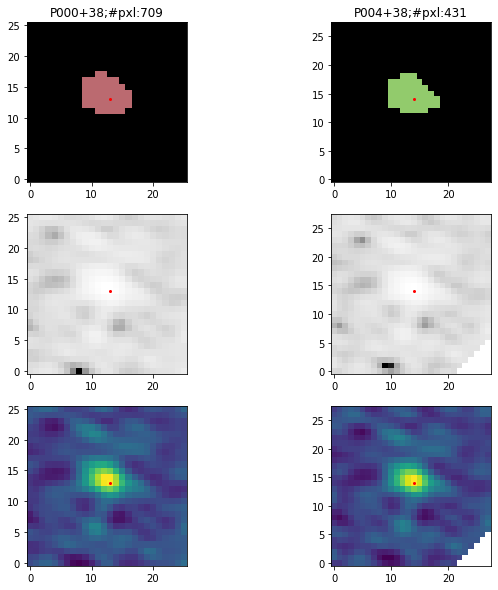

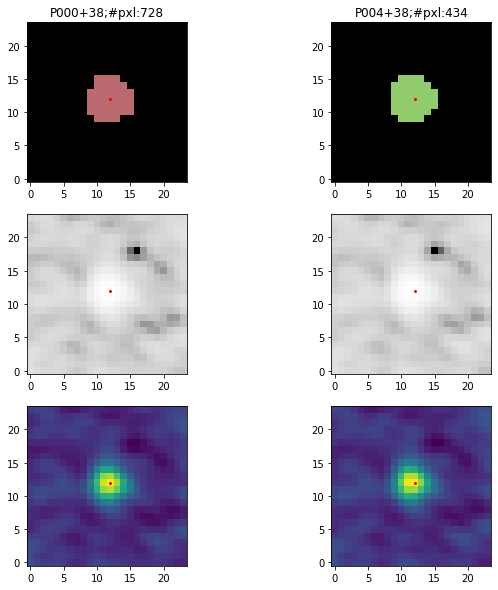

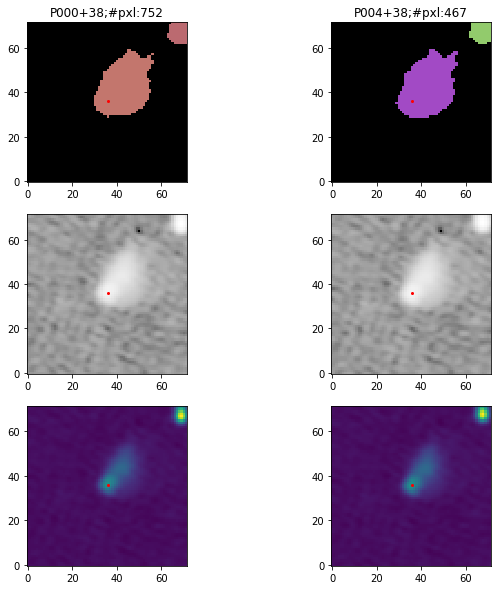

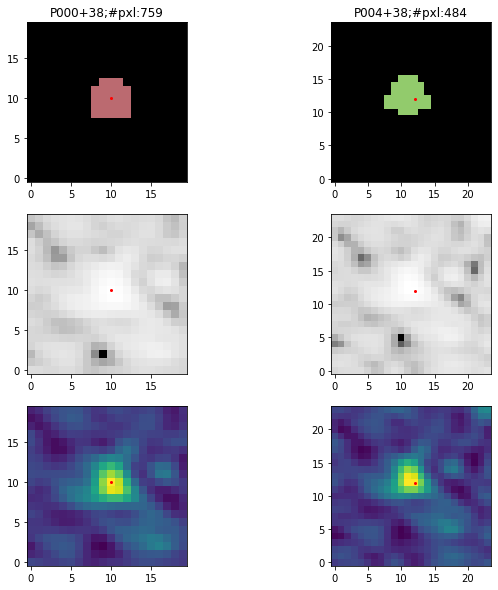

...

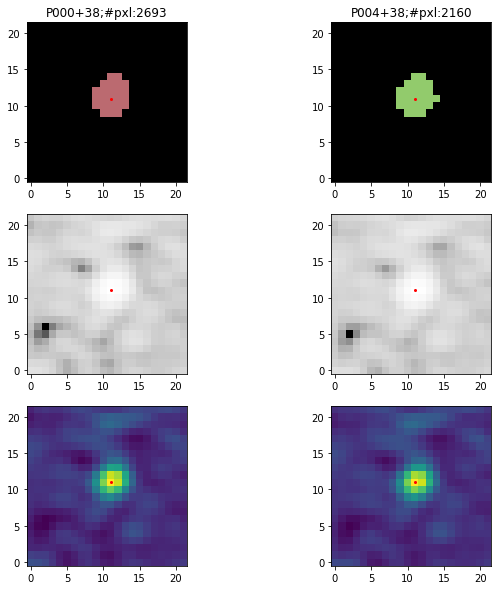

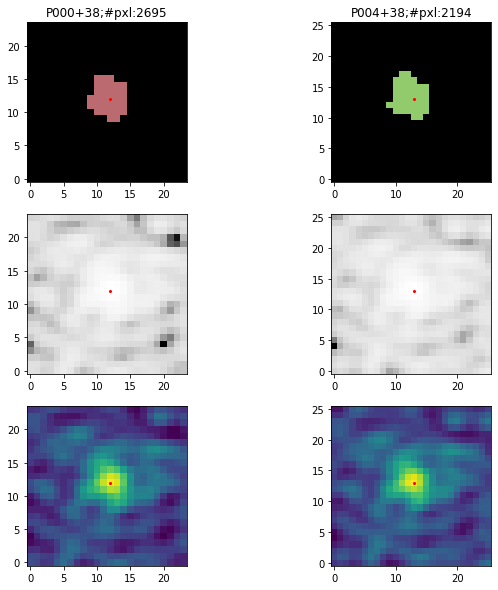

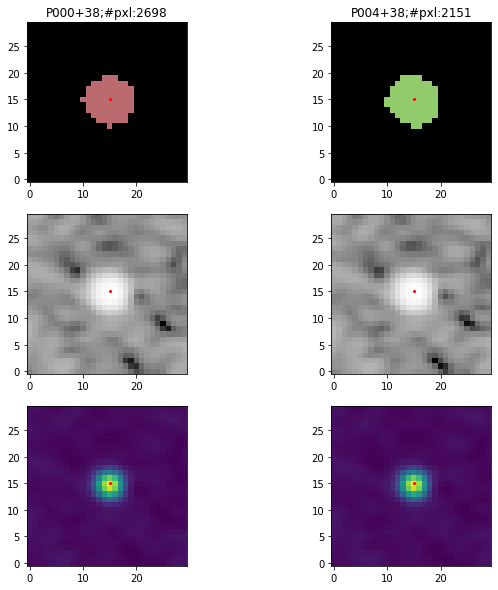

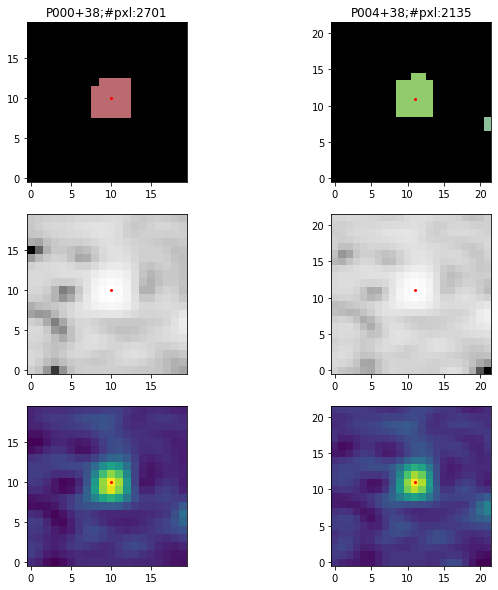

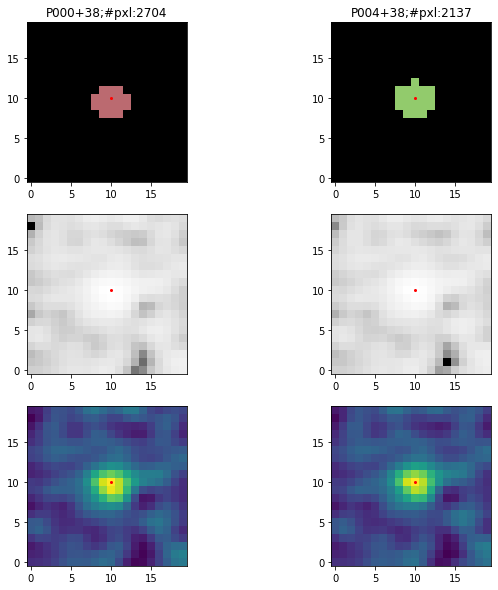

Error in callback <function flush_figures at 0x7fd60515b7b8> (for post_execute):


KeyboardInterrupt: 

In [121]:
# iterate over all components in the "value" dataframe to match components in the "key" value
eps = 0.0016
for i1, r1 in enumerate(P000_stats_mat):
    ra1 = r1[header.index('brightest_pixel_RA')]
    dec1 = r1[header.index('brightest_pixel_DEC')]
    for i2, r2 in enumerate(P004_stats_mat):
        ra2 = r2[header.index('brightest_pixel_RA')]
        dec2 = r2[header.index('brightest_pixel_DEC')]
        if (ra2 >= ra1-eps and ra2 <= ra1+eps) and (dec2 >= dec1-eps and dec2 <= dec1+eps):
            # print(r1)
            # print(r2)
            print(ra1, 'is near', ra2)
            print(dec1, 'is near', dec2)
            
            fig, axs = plt.subplots(3, 2, figsize=(10,10))
            
            P000_d_crop, P000_s_crop, P000_cmap, P000_x, P000_y = create_catalogue_submatrix(P000_header, P000_data, P000_sources,
                                                                             P000_min_max_coords[i1],
                                                                             P000_source_intensities[i1], i1,
                                                                             False, True)
            axs[1,0].imshow(P000_d_crop, origin='lower', cmap='Greys_r', norm=ImageNormalize(stretch=LogStretch()))
            axs[1,0].scatter(P000_x, P000_y, s=4, c='red')
            
            axs[0,0].imshow(P000_s_crop, origin='lower', cmap=P000_cmap)
            axs[0,0].set_title("%s;#pxl:%s"%(P000_header['OBJECT'], i1))
            axs[0,0].scatter(P000_x, P000_y, s=4, c='red')
            
            P004_d_crop, P004_s_crop, P004_cmap, P004_x, P004_y = create_catalogue_submatrix(P004_header, P004_data, P004_sources,
                                                                             P004_min_max_coords[i2],
                                                                             P004_source_intensities[i2], i2,
                                                                             False, True)
            axs[1,1].imshow(P004_d_crop, origin='lower', cmap='Greys_r', norm=ImageNormalize(stretch=LogStretch()))
            axs[1,1].scatter(P004_x, P004_y, s=4, c='red')
            
            axs[0,1].imshow(P004_s_crop, origin='lower', cmap=P004_cmap)
            axs[0,1].set_title("%s;#pxl:%s"%(P004_header['OBJECT'], i2))
            axs[0,1].scatter(P004_x, P004_y, s=4, c='red')
            
            
            axs[2,0].imshow(P000_d_crop, origin='lower')
            axs[2,0].scatter(P000_x, P000_y, s=4, c='red')
            
            axs[2,1].imshow(P004_d_crop, origin='lower')
            axs[2,1].scatter(P004_x, P004_y, s=4, c='red')
            
            plt.savefig('temp/{}:{}_{}:{}'.format(P000_header['OBJECT'], i1, P004_header['OBJECT'], i2))
            
            # plt.show()
            # print('-'*120)
            # break
    # break

# Old

In [310]:
# The function to create the catalogue
def create_catalogue_data(hdul, sources):
    # Major beam axis in arc seconds
    header = fits.getheader(mosaic_path + "P004+38_mosaic-blanked.fits")
    diameter_beam = header['BMAJ'] * 3600
    conversion = pi * pow(diameter_beam, 2) / (4 * log(2))

    data = hdul.data
    w = WCS(hdul.header)
    v_pixel_to_wcs = np.vectorize(lambda a, b: w.all_pix2world(a, b, 0, ra_dec_order=True))
    
    integrated_intensity = np.zeros(sources.max_label)
    center_of_mass = np.zeros((sources.max_label, 2))
    brightest_pixel = np.zeros((sources.max_label, 5))
    
    for i in range(np.shape(data)[0]):
        for j in range(np.shape(data)[1]):
            lab = sources.data[i, j] - 1  # Label of pixel i,j
            val = data[i, j]  # Intensity value of pixel i,j
            if lab + 1 != 0:
                integrated_intensity[lab] += val  # Sum for each label the intensity of each pixel
                center_of_mass[lab, :] += val * np.array([i, j])  # Sum the intensity times pixel position (i, j)
                if val > brightest_pixel[lab][0]:
                    # Keep the highest value per source
                    ra, dec = w.all_pix2world(i, j, 0, ra_dec_order=True)
                    brightest_pixel[lab] = np.array([val, i, j, ra, dec])
    
    # (pi * (Diameter_Beam)^2 / 4 * ln(2)) / (Pixel_Size)^2
    conv_integrated_intensity = conversion * integrated_intensity
    norm_center_of_mass = center_of_mass / np.array([conv_integrated_intensity, conv_integrated_intensity]).T
    norm_center_of_mass = norm_center_of_mass.astype(int)
    wc_norm_center_of_mass = np.array(v_pixel_to_wcs(norm_center_of_mass[:,0], norm_center_of_mass[:,1])).astype(int)
    
    return np.column_stack([
        np.arange(1, sources.max_label+1, dtype='int8'), # Source label
        integrated_intensity, # Integrated intensity   (intensity sum of each source)
        brightest_pixel[:,0], # Peak pixel intensity   (max intensity in each source)
        brightest_pixel[:,1], # x of peak pixel   (x of max intensity in each source)
        brightest_pixel[:,2], # y of peak pixel   (y of max intensity in each source)
        brightest_pixel[:,3], # RA of peak pixel  (RA of max intensity in each source)
        brightest_pixel[:,4], # DEC of peak pixel (DEC of max intensity in each source)
        norm_center_of_mass[:,0], # x pixel of norm center of mass
        norm_center_of_mass[:,1],  # y pixel of norm center of mass 
        wc_norm_center_of_mass[0], # Ra coords of norm center of mass
        wc_norm_center_of_mass[1] # Dec coords of norm center of masss
    ])

cat_matrix = create_catalogue_data(hdul[0], sources)

KeyboardInterrupt: 

In [27]:
cat_matrix[index]

NameError: name 'cat_matrix' is not defined

In [19]:
chunkest_source = sorted(np.unique(sources.data, return_counts=True)[1][1:], reverse=True)[80]
print(chunkest_source)
np.where(np.unique(sources.data, return_counts=True)[1] == chunkest_source)

501


(array([1869]),)

In [31]:
def create_sub_matrices(hdul, sources):
    data = hdul.data
    min_max_coords = np.full((sources.max_label, 2, 2), ((np.inf, np.inf), (-np.inf, -np.inf)))
    for i in range(np.shape(data)[0]):
        for j in range(np.shape(data)[1]):
            lab = sources.data[i, j] - 1  # Label of pixel i,j
            if lab + 1 != 0:
                # Define min max coords
                min_coords = min_max_coords[lab][0]
                max_coords = min_max_coords[lab][1]
                # Check if smallest x coordinate
                if i < min_coords[0]:
                    min_coords[0] = i
                # Check if biggest x coordinate
                elif i > max_coords[0]:
                    max_coords[0] = i
                # Check if smallest y coordinate
                if j < min_coords[1]:
                    min_coords[1] = j
                # Check if biggest y coordinate
                elif j > max_coords[1]:
                    max_coords[1] = j
    
    min_max_coords = min_max_coords.astype(int)
    all_sub_matrices = []
    
    for i in range(len(min_max_coords)):
        # Define min and max coords
        min_coords = min_max_coords[i][0]
        max_coords = min_max_coords[i][1] + 1
        # Mask of labels
        mask = sources.data[min_coords[0]:max_coords[0],
                            min_coords[1]:max_coords[1]]
        # Only take labels of current source and factor it against the intensities
        sub_matrix = (mask == i+1) * data[min_coords[0]:max_coords[0],
                                          min_coords[1]:max_coords[1]]
        
        label = hdul.header['OBJECT'] + '_' + str(i)
        
        all_sub_matrices.append(
            create_catalogue_submatrix(hdul, label, min_coords, max_coords, sub_matrix)
        )
    
    return all_sub_matrices

In [32]:
def create_catalogue_submatrix(hdul, label, min_coords, max_coords, mat):
    conv = pi * pow((hdul.header['BMAJ'] * 3600), 2) / (4 * log(2)) 
    w = WCS(hdul.header)
    
    # matrix filled with index values so first row for x = [0, 1, 2, ...] and y = [0, 0, 0, ..]
    # Used to fit gaussian and to calculate norm center of mass
    y, x = np.mgrid[:mat.shape[0], :mat.shape[1]]
    
    # Get sum intensity
    sum_mat = np.sum(mat)
    integrated_intensity = conv * sum_mat
    
    # Brightest pixel (account for local submatrix coordinates)
    brightest_pixel_x, brightest_pixel_y = np.unravel_index(np.argmax(mat, axis=None), mat.shape)
    brightest_pixel = mat[(brightest_pixel_x, brightest_pixel_y)]
    brightest_pixel_x += min_coords[0] # Add the min x coord of source
    brightest_pixel_y += min_coords[1] # Add the min y coord of source
    brightest_pixel_RA, brightest_pixel_DEC = w.all_pix2world(brightest_pixel_x,
                                                              brightest_pixel_y, 0, ra_dec_order=True)
    
    # center of mass = sum(( coords(x, y) * mat(inten) )) / integrated_intensity
    center_of_mass_x, center_of_mass_y = np.sum(np.sum(np.array(( (x + min_coords[0]),
                                                                  (y + min_coords[1]) )) * mat, axis=1), axis=1) / sum_mat 
    # center_of_mass_x = np.sum(np.dot((x + min_coords[0]).T, mat)) / integrated_intensity
    # center_of_mass_y = np.sum(np.dot((y + min_coords[1]).T, mat)) / integrated_intensity
    # center_of_mass_x = np.sum(np.sum((x + min_coords[0]) * mat, axis=1)) / sum_mat
    # center_of_mass_y = np.sum(np.sum((y + min_coords[1]) * mat, axis=1)) / sum_mat
    
    # center_of_mass = np.around(center_of_mass, 0).astype(int)

    center_of_mass_RA, center_of_mass_DEC = w.all_pix2world(center_of_mass_x,
                                                            center_of_mass_y, 0, ra_dec_order=True)
    
    # Define parameters of gaussian
    x_m = center_of_mass_x - min_coords[0]
    y_m = center_of_mass_y - min_coords[1]
    x_s = max_coords[0] - min_coords[0]
    y_s = max_coords[1] - min_coords[1]
    
    # Define model
    mod = Gaussian2D(
        amplitude=brightest_pixel, # Max intensity of source
        x_mean=x_m,    # X center of mass
        y_mean=y_m,    # Y center of mass
        x_stddev=x_s,  # X of submatrix
        y_stddev=y_s   # Y of submatrix
    )
    
    # Setting resutrictions for model
    mod.x_mean.min=0   # x_mean Min = 0
    mod.y_mean.min=0   # y_mean Min = 0
    mod.x_mean.max=x_s # x_mean Max = X of submatrix
    mod.y_mean.max=y_s # y_mean Max = Y of submatrix

    mod.x_stddev.min=0   # x_stdv Min = 0
    mod.y_stddev.min=0   # y_stdv Min = 0
    mod.x_stddev.max=x_s # x_stdv Max = X of submatrix
    mod.y_stddev.max=y_s # y_stdv Max = Y of submatrix
    
    fitter = LevMarLSQFitter() # Use least square fitter
    
    try:
        best_fit_gauss = fitter(mod, x, y, mat) # Fit model
    except:
        return (label, [integrated_intensity, brightest_pixel, brightest_pixel_x, brightest_pixel_y,
                        brightest_pixel_RA, brightest_pixel_DEC, center_of_mass_x, center_of_mass_y,
                        center_of_mass_RA, center_of_mass_DEC, 'NaN', 'NaN',
                        'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN']
       )
    
    # best_fit_gauss = fitter(mod, x, y, mat) # Fit model

    # Define centers of gaussian fit
    center_of_gaus_fit_x = best_fit_gauss.x_mean.value + min_coords[0]
    center_of_gaus_fit_y = best_fit_gauss.y_mean.value + min_coords[1]
    center_of_gaus_fit_RA, center_of_gaus_fit_DEC = w.all_pix2world(center_of_gaus_fit_x,
                                                                    center_of_gaus_fit_y, 0, ra_dec_order=True)
    
    # Define axis and theta of fit
    fit_x_axis = best_fit_gauss.x_stddev.value
    fit_y_axis = best_fit_gauss.y_stddev.value
    fit_theta  = best_fit_gauss.theta.value
    
    # Integrated intensity of fit
    integrated_intensity_fit = conv * np.sum(best_fit_gauss(x, y))
    
    # Residual / Source (sum intensities)
    ratio_residual = np.sum((mat - best_fit_gauss(x, y)).clip(min=0)) / sum_mat
    
    return (label, [integrated_intensity, brightest_pixel, brightest_pixel_x, brightest_pixel_y,
                    brightest_pixel_RA, brightest_pixel_DEC, center_of_mass_x, center_of_mass_y,
                    center_of_mass_RA, center_of_mass_DEC, center_of_gaus_fit_x, center_of_gaus_fit_y,
                    center_of_gaus_fit_RA, center_of_gaus_fit_DEC, fit_x_axis, fit_y_axis, fit_theta,
                    integrated_intensity_fit, ratio_residual]
           )

In [ ]:
start = time.time()
matrices = create_sub_matrices(hdul[0], sources)
print(time.time()-start)

In [14]:
np.where(P000_sources.data == 1)

(array([65, 65, 65, 65, 66, 66, 66, 66, 66, 66, 66, 67, 67, 67, 67, 67, 67,
        67, 68, 68, 68, 68, 68, 68, 68, 69, 69, 69, 69, 69, 70, 70, 70, 70,
        70, 71, 71, 71]),
 array([5655, 5656, 5657, 5658, 5654, 5655, 5656, 5657, 5658, 5659, 5660,
        5654, 5655, 5656, 5657, 5658, 5659, 5660, 5654, 5655, 5656, 5657,
        5658, 5659, 5660, 5655, 5656, 5657, 5658, 5659, 5655, 5656, 5657,
        5658, 5659, 5656, 5657, 5658]))